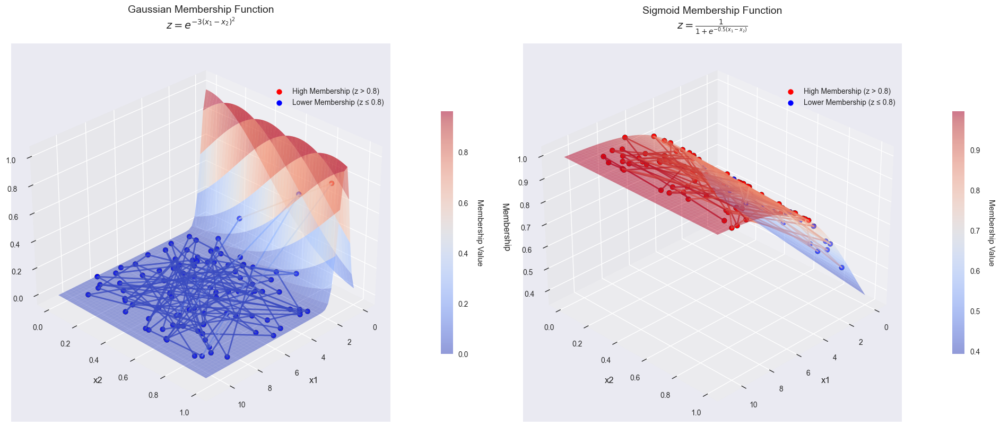

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from typing import List, Tuple
import random

def validate_input(data: List[Tuple[float, float]]) -> None:
    """Validate input data format and values."""
    if not data:
        raise ValueError("Input data cannot be empty")
    for point in data:
        if not isinstance(point, tuple) or len(point) != 2:
            raise ValueError("Each point must be a tuple of two numbers")
        if not all(isinstance(val, (int, float)) for val in point):
            raise ValueError("Point coordinates must be numbers")

def create_grid(x1: np.ndarray, x2: np.ndarray, padding: float = 1.0, points: int = 50) -> Tuple[np.ndarray, np.ndarray]:
    """Create mesh grid for surface plotting."""
    x1_grid = np.linspace(min(x1) - padding, max(x1) + padding, points)
    x2_grid = np.linspace(0, 1, points)
    return np.meshgrid(x1_grid, x2_grid)

def plot_function(ax: Axes3D, x1: np.ndarray, x2: np.ndarray, z: np.ndarray, 
                 X1: np.ndarray, X2: np.ndarray, Z: np.ndarray, 
                 title: str) -> Tuple:
    """Plot 3D surface and scatter points with custom coloring."""
    cmap = plt.colormaps['coolwarm'] 
    
    surf = ax.plot_surface(X1, X2, Z, cmap=cmap, alpha=0.5, rstride=1, cstride=1)
    
    point_colors = np.where(z > 0.8, 'red', 'blue')
    
    scatter = ax.scatter(x1, x2, z, c=point_colors, s=50, edgecolor='k', depthshade=False)
    
    for i in range(len(x1)-1):
        ax.plot(x1[i:i+2], x2[i:i+2], z[i:i+2], 
                color=cmap((z[i]+z[i+1])/2), 
                linewidth=2, alpha=0.8)
    
    ax.set_xlabel('x1', fontsize=12, labelpad=10)
    ax.set_ylabel('x2', fontsize=12, labelpad=10)
    ax.set_zlabel('Membership', fontsize=12, labelpad=10)
    ax.set_title(title, fontsize=14, pad=20)
    
    ax.view_init(elev=30, azim=45)
    
    return surf, scatter

def generate_random_data(num_points: int = 100) -> List[Tuple[float, float]]:
    """Generate random data points for visualization."""
    return [(random.uniform(1, 10), random.random()) for _ in range(num_points)]

def visualize_functions(A: List[Tuple[float, float]], B: List[Tuple[float, float]]) -> None:
    """Visualize Gaussian and Sigmoid functions in 3D space."""
    # Input validation
    validate_input(A)
    validate_input(B)
    
    plt.style.use('seaborn-v0_8')
    fig = plt.figure(figsize=(20, 10), dpi=100)
    
    ax1 = fig.add_subplot(121, projection='3d')
    
    x1_A = np.array([a[0] for a in A])
    x2_A = np.array([a[1] for a in A])
    z_A = np.exp(-3 * (x1_A - x2_A)**2)
    
    X1_A, X2_A = create_grid(x1_A, x2_A)
    Z_A = np.exp(-3 * (X1_A - X2_A)**2)
    
    
    surf_A, _ = plot_function(
        ax1, x1_A, x2_A, z_A, X1_A, X2_A, Z_A,
        'Gaussian Membership Function\n$z = e^{-3(x_1-x_2)^2}$'
    )
    
    cbar1 = fig.colorbar(surf_A, ax=ax1, shrink=0.5, pad=0.1)
    cbar1.set_label('Membership Value', rotation=270, labelpad=20)
    
    ax2 = fig.add_subplot(122, projection='3d')
    
    x1_B = np.array([b[0] for b in B])
    x2_B = np.array([b[1] for b in B])
    z_B = 1 / (1 + np.exp(-0.5 * (x1_B - x2_B)))

    X1_B, X2_B = create_grid(x1_B, x2_B)
    Z_B = 1 / (1 + np.exp(-0.5 * (X1_B - X2_B)))
    
    surf_B, _ = plot_function(
        ax2, x1_B, x2_B, z_B, X1_B, X2_B, Z_B,
        'Sigmoid Membership Function\n$z = \\frac{1}{1+e^{-0.5(x_1-x_2)}}$'
    )
    
    cbar2 = fig.colorbar(surf_B, ax=ax2, shrink=0.5, pad=0.1)
    cbar2.set_label('Membership Value', rotation=270, labelpad=20)
    
    for ax in [ax1, ax2]:
        ax.scatter([], [], c='red', label='High Membership (z > 0.8)', s=50)
        ax.scatter([], [], c='blue', label='Lower Membership (z ≤ 0.8)', s=50)
        ax.legend(loc='upper right', bbox_to_anchor=(1, 0.9), fontsize=10)
    
    plt.tight_layout(pad=3.0)
    plt.savefig('membership_function_visualization.png', dpi=300, bbox_inches='tight')
    plt.show()

if __name__ == "__main__":
    random.seed(42)  
    A = generate_random_data(100)
    B = generate_random_data(100)
    
    try:
        visualize_functions(A, B)
    except Exception as e:
        print(f"Error: {str(e)}")

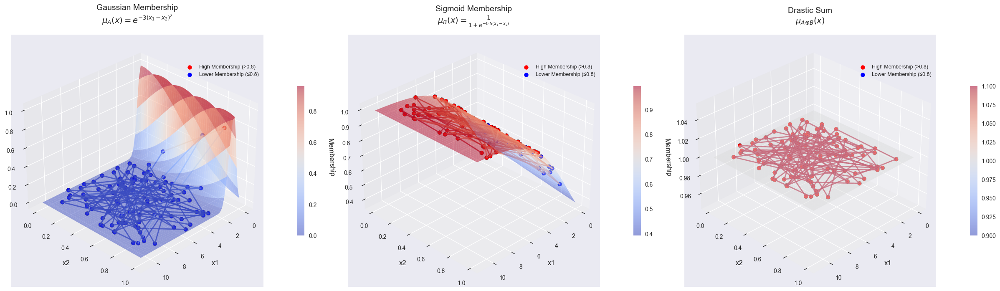

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from typing import List, Tuple
import random

def validate_input(data: List[Tuple[float, float]]) -> None:
    """Validate input data format and values."""
    if not data:
        raise ValueError("Input data cannot be empty")
    for point in data:
        if not isinstance(point, tuple) or len(point) != 2:
            raise ValueError("Each point must be a tuple of two numbers")
        if not all(isinstance(val, (int, float)) for val in point):
            raise ValueError("Point coordinates must be numbers")

def create_grid(x1: np.ndarray, x2: np.ndarray, padding: float = 1.0, points: int = 50) -> Tuple[np.ndarray, np.ndarray]:
    """Create mesh grid for surface plotting."""
    x1_grid = np.linspace(min(x1) - padding, max(x1) + padding, points)
    x2_grid = np.linspace(0, 1, points)
    return np.meshgrid(x1_grid, x2_grid)

def plot_function(ax: Axes3D, x1: np.ndarray, x2: np.ndarray, z: np.ndarray, 
                 X1: np.ndarray, X2: np.ndarray, Z: np.ndarray, 
                 title: str) -> Tuple:
    """Plot 3D surface and scatter points with custom coloring."""
    cmap = plt.colormaps['coolwarm']
    
    surf = ax.plot_surface(X1, X2, Z, cmap=cmap, alpha=0.5, rstride=1, cstride=1)
    
    point_colors = np.where(z > 0.8, 'red', 'blue')
    
    scatter = ax.scatter(x1, x2, z, c=point_colors, s=50, edgecolor='k', depthshade=False)
    
    for i in range(len(x1)-1):
        ax.plot(x1[i:i+2], x2[i:i+2], z[i:i+2], 
                color=cmap((z[i]+z[i+1])/2), 
                linewidth=2, alpha=0.8)
    
    # Customize axes
    ax.set_xlabel('x1', fontsize=12, labelpad=10)
    ax.set_ylabel('x2', fontsize=12, labelpad=10)
    ax.set_zlabel('Membership', fontsize=12, labelpad=10)
    ax.set_title(title, fontsize=14, pad=20)
    
    ax.view_init(elev=30, azim=45)
    
    return surf, scatter

def generate_random_data(num_points: int = 100) -> List[Tuple[float, float]]:
    """Generate random data points for visualization."""
    return [(random.uniform(1, 10), random.random()) for _ in range(num_points)]

def calculate_membership(x1: np.ndarray, x2: np.ndarray, func_type: str) -> np.ndarray:
    """Calculate membership values based on function type."""
    if func_type == 'gaussian':
        return np.exp(-3 * (x1 - x2)**2)
    elif func_type == 'sigmoid':
        return 1 / (1 + np.exp(-0.5 * (x1 - x2)))
    else:
        raise ValueError("Unknown function type")

def drastic_sum(a: np.ndarray, b: np.ndarray) -> np.ndarray:
    """
    Calculate drastic sum of two fuzzy sets.
    μ_A⊕B(x) = max(μ_A(x), μ_B(x)) if min(μ_A(x), μ_B(x)) == 0
                1 otherwise
    """
    return np.where((a == 0) | (b == 0), np.maximum(a, b), 1.0)

def visualize_functions(A: List[Tuple[float, float]], B: List[Tuple[float, float]]) -> None:
    """Visualize original functions and their drastic sum in 3D space."""
    validate_input(A)
    validate_input(B)
    
    plt.style.use('seaborn-v0_8')
    fig = plt.figure(figsize=(25, 8), dpi=100)
    
    x1_A = np.array([a[0] for a in A])
    x2_A = np.array([a[1] for a in A])
    x1_B = np.array([b[0] for b in B])
    x2_B = np.array([b[1] for b in B])
    
    z_A = calculate_membership(x1_A, x2_A, 'gaussian')
    z_B = calculate_membership(x1_B, x2_B, 'sigmoid')
    
    X1, X2 = create_grid(x1_A, x2_A)
    
    Z_A = calculate_membership(X1, X2, 'gaussian')
    Z_B = calculate_membership(X1, X2, 'sigmoid')
    Z_drastic = drastic_sum(Z_A, Z_B)
    
    ax1 = fig.add_subplot(131, projection='3d')
    surf_A, _ = plot_function(
        ax1, x1_A, x2_A, z_A, X1, X2, Z_A,
        'Gaussian Membership\n$μ_A(x) = e^{-3(x_1-x_2)^2}$'
    )
    fig.colorbar(surf_A, ax=ax1, shrink=0.5, pad=0.1)
    
    ax2 = fig.add_subplot(132, projection='3d')
    surf_B, _ = plot_function(
        ax2, x1_B, x2_B, z_B, X1, X2, Z_B,
        'Sigmoid Membership\n$μ_B(x) = \\frac{1}{1+e^{-0.5(x_1-x_2)}}$'
    )
    fig.colorbar(surf_B, ax=ax2, shrink=0.5, pad=0.1)
    
    ax3 = fig.add_subplot(133, projection='3d')
    z_drastic = drastic_sum(z_A, z_B)
    surf_drastic, _ = plot_function(
        ax3, x1_A, x2_A, z_drastic, X1, X2, Z_drastic,
        'Drastic Sum\n$μ_{A⊕B}(x)$'
    )
    fig.colorbar(surf_drastic, ax=ax3, shrink=0.5, pad=0.1)
    
    for ax in [ax1, ax2, ax3]:
        ax.scatter([], [], c='red', label='High Membership (>0.8)', s=50)
        ax.scatter([], [], c='blue', label='Lower Membership (≤0.8)', s=50)
        ax.legend(loc='upper right', bbox_to_anchor=(1, 0.9), fontsize=9)
    
    plt.tight_layout(pad=3.0)
    plt.savefig('drastic_sum_visualization.png', dpi=300, bbox_inches='tight')
    plt.show()

if __name__ == "__main__":
    random.seed(42)
    A = generate_random_data(100)
    B = generate_random_data(100)
    
    try:
        visualize_functions(A, B)
    except Exception as e:
        print(f"Error: {str(e)}")

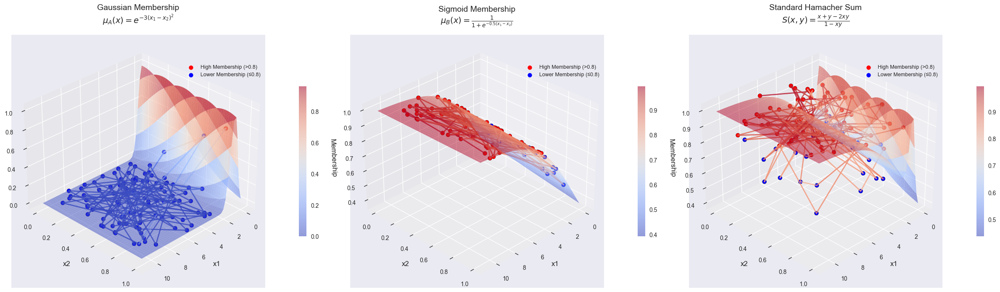

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from typing import List, Tuple
import random

def validate_input(data: List[Tuple[float, float]]) -> None:
    """Validate input data format and values."""
    if not data:
        raise ValueError("Input data cannot be empty")
    for point in data:
        if not isinstance(point, tuple) or len(point) != 2:
            raise ValueError("Each point must be a tuple of two numbers")
        if not all(isinstance(val, (int, float)) for val in point):
            raise ValueError("Point coordinates must be numbers")

def create_grid(x1: np.ndarray, x2: np.ndarray, padding: float = 1.0, points: int = 50) -> Tuple[np.ndarray, np.ndarray]:
    """Create mesh grid for surface plotting."""
    x1_grid = np.linspace(min(x1) - padding, max(x1) + padding, points)
    x2_grid = np.linspace(0, 1, points)
    return np.meshgrid(x1_grid, x2_grid)

def plot_function(ax: Axes3D, x1: np.ndarray, x2: np.ndarray, z: np.ndarray, 
                 X1: np.ndarray, X2: np.ndarray, Z: np.ndarray, 
                 title: str) -> Tuple:
    """Plot 3D surface and scatter points with custom coloring."""
    cmap = plt.colormaps['coolwarm']
    
    surf = ax.plot_surface(X1, X2, Z, cmap=cmap, alpha=0.5, rstride=1, cstride=1)
    
    point_colors = np.where(z > 0.8, 'red', 'blue')
    
    scatter = ax.scatter(x1, x2, z, c=point_colors, s=50, edgecolor='k', depthshade=False)
    
    for i in range(len(x1)-1):
        ax.plot(x1[i:i+2], x2[i:i+2], z[i:i+2], 
                color=cmap((z[i]+z[i+1])/2), 
                linewidth=2, alpha=0.8)
    
    ax.set_xlabel('x1', fontsize=12, labelpad=10)
    ax.set_ylabel('x2', fontsize=12, labelpad=10)
    ax.set_zlabel('Membership', fontsize=12, labelpad=10)
    ax.set_title(title, fontsize=14, pad=20)
    
    ax.view_init(elev=30, azim=45)
    
    return surf, scatter

def generate_random_data(num_points: int = 100) -> List[Tuple[float, float]]:
    """Generate random data points for visualization."""
    return [(random.uniform(1, 10), random.random()) for _ in range(num_points)]

def calculate_membership(x1: np.ndarray, x2: np.ndarray, func_type: str) -> np.ndarray:
    """Calculate membership values based on function type."""
    if func_type == 'gaussian':
        return np.exp(-3 * (x1 - x2)**2)
    elif func_type == 'sigmoid':
        return 1 / (1 + np.exp(-0.5 * (x1 - x2)))
    else:
        raise ValueError("Unknown function type")

def standard_hamacher_sum(a: np.ndarray, b: np.ndarray) -> np.ndarray:
    """
    Calculate standard Hamacher sum (T-conorm) of two fuzzy sets.
    S(x,y) = (x + y - 2xy)/(1 - xy)
    
    Special cases:
    - When x=0: S(0,y) = y
    - When y=0: S(x,0) = x
    - When x=1 or y=1: S(x,1) = S(1,y) = 1
    """
    numerator = a + b - 2*a*b
    denominator = 1 - a*b
    return np.where(denominator == 0, 1.0, numerator / denominator)

def visualize_functions(A: List[Tuple[float, float]], B: List[Tuple[float, float]]) -> None:
    """Visualize original functions and their Hamacher sum in 3D space."""
    validate_input(A)
    validate_input(B)
    
    plt.style.use('seaborn-v0_8')
    fig = plt.figure(figsize=(25, 8), dpi=100)
    
    x1_A = np.array([a[0] for a in A])
    x2_A = np.array([a[1] for a in A])
    x1_B = np.array([b[0] for b in B])
    x2_B = np.array([b[1] for b in B])
    
    z_A = calculate_membership(x1_A, x2_A, 'gaussian')
    z_B = calculate_membership(x1_B, x2_B, 'sigmoid')
    
    X1, X2 = create_grid(x1_A, x2_A)
    
    Z_A = calculate_membership(X1, X2, 'gaussian')
    Z_B = calculate_membership(X1, X2, 'sigmoid')
    Z_hamacher = standard_hamacher_sum(Z_A, Z_B)
    
    # Plot Gaussian (Left)
    ax1 = fig.add_subplot(131, projection='3d')
    surf_A, _ = plot_function(
        ax1, x1_A, x2_A, z_A, X1, X2, Z_A,
        'Gaussian Membership\n$μ_A(x) = e^{-3(x_1-x_2)^2}$'
    )
    fig.colorbar(surf_A, ax=ax1, shrink=0.5, pad=0.1)
    
    # Plot Sigmoid (Middle)
    ax2 = fig.add_subplot(132, projection='3d')
    surf_B, _ = plot_function(
        ax2, x1_B, x2_B, z_B, X1, X2, Z_B,
        'Sigmoid Membership\n$μ_B(x) = \\frac{1}{1+e^{-0.5(x_1-x_2)}}$'
    )
    fig.colorbar(surf_B, ax=ax2, shrink=0.5, pad=0.1)
    
    ax3 = fig.add_subplot(133, projection='3d')
    z_hamacher = standard_hamacher_sum(z_A, z_B)
    surf_hamacher, _ = plot_function(
        ax3, x1_A, x2_A, z_hamacher, X1, X2, Z_hamacher,
        'Standard Hamacher Sum\n$S(x,y) = \\frac{x + y - 2xy}{1 - xy}$'
    )
    fig.colorbar(surf_hamacher, ax=ax3, shrink=0.5, pad=0.1)
    
    # Add legends
    for ax in [ax1, ax2, ax3]:
        ax.scatter([], [], c='red', label='High Membership (>0.8)', s=50)
        ax.scatter([], [], c='blue', label='Lower Membership (≤0.8)', s=50)
        ax.legend(loc='upper right', bbox_to_anchor=(1, 0.9), fontsize=9)
    
    plt.tight_layout(pad=3.0)
    plt.savefig('standard_hamacher_sum_visualization.png', dpi=300, bbox_inches='tight')
    plt.show()

if __name__ == "__main__":
    random.seed(42)
    A = generate_random_data(100)
    B = generate_random_data(100)
    
    try:
        visualize_functions(A, B)
    except Exception as e:
        print(f"Error: {str(e)}")

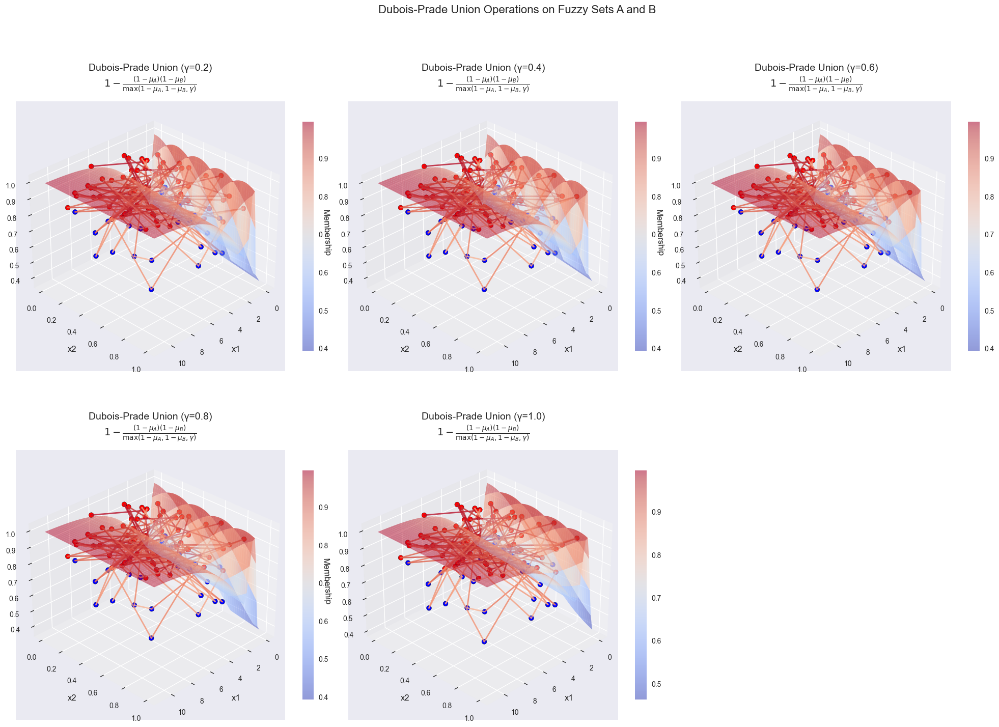

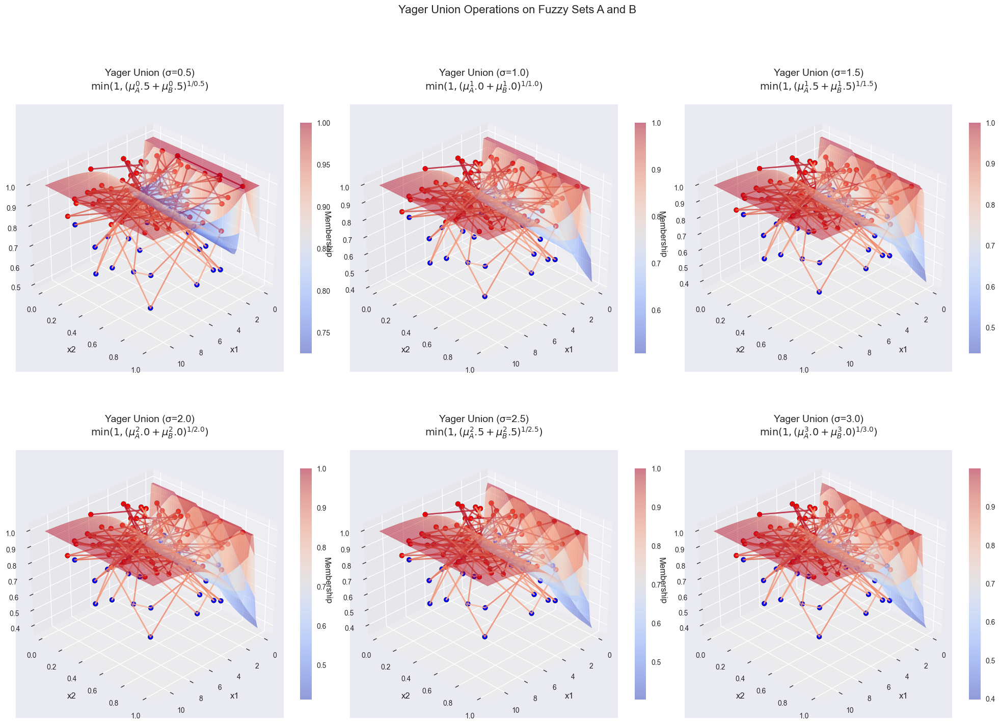


Effect of Parameters on Union Operations:

Dubois-Prade (γ):
- γ→0: Approaches algebraic sum (probabilistic sum)
- γ=1: Becomes maximum operator s(x,y) = max(x,y)

Yager (σ):
- σ→0: Approaches maximum operator
- σ=1: Becomes bounded sum min(1, x+y)
- σ→∞: Approaches drastic union (1 if x or y > 0)


In [8]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from typing import List, Tuple
import random

def validate_input(data: List[Tuple[float, float]]) -> None:
    """Validate input data format and values."""
    if not data:
        raise ValueError("Input data cannot be empty")
    for point in data:
        if not isinstance(point, tuple) or len(point) != 2:
            raise ValueError("Each point must be a tuple of two numbers")
        if not all(isinstance(val, (int, float)) for val in point):
            raise ValueError("Point coordinates must be numbers")

def create_grid(x1: np.ndarray, x2: np.ndarray, padding: float = 1.0, points: int = 50) -> Tuple[np.ndarray, np.ndarray]:
    """Create mesh grid for surface plotting."""
    x1_grid = np.linspace(min(x1) - padding, max(x1) + padding, points)
    x2_grid = np.linspace(0, 1, points)
    return np.meshgrid(x1_grid, x2_grid)

def plot_function(ax: Axes3D, x1: np.ndarray, x2: np.ndarray, z: np.ndarray, 
                 X1: np.ndarray, X2: np.ndarray, Z: np.ndarray, 
                 title: str) -> Tuple:
    """Plot 3D surface and scatter points with custom coloring."""
    cmap = plt.colormaps['coolwarm']
    
    surf = ax.plot_surface(X1, X2, Z, cmap=cmap, alpha=0.5, rstride=1, cstride=1)
    
    point_colors = np.where(z > 0.8, 'red', 'blue')
    
    scatter = ax.scatter(x1, x2, z, c=point_colors, s=50, edgecolor='k', depthshade=False)
    
    for i in range(len(x1)-1):
        ax.plot(x1[i:i+2], x2[i:i+2], z[i:i+2], 
                color=cmap((z[i]+z[i+1])/2), 
                linewidth=2, alpha=0.8)
    
    ax.set_xlabel('x1', fontsize=12, labelpad=10)
    ax.set_ylabel('x2', fontsize=12, labelpad=10)
    ax.set_zlabel('Membership', fontsize=12, labelpad=10)
    ax.set_title(title, fontsize=14, pad=20)
    
    ax.view_init(elev=30, azim=45)
    
    return surf, scatter

def generate_random_data(num_points: int = 100) -> List[Tuple[float, float]]:
    """Generate random data points for visualization."""
    return [(random.uniform(1, 10), random.random()) for _ in range(num_points)]

def calculate_membership(x1: np.ndarray, x2: np.ndarray, func_type: str) -> np.ndarray:
    """Calculate membership values based on function type."""
    if func_type == 'gaussian':
        return np.exp(-3 * (x1 - x2)**2)
    elif func_type == 'sigmoid':
        return 1 / (1 + np.exp(-0.5 * (x1 - x2)))
    else:
        raise ValueError("Unknown function type")

def dubois_prade_snorm(a: np.ndarray, b: np.ndarray, gamma: float) -> np.ndarray:
    """
    Dubois-Prade S-norm (Union operation):
    s_γ[a,b] = 1 - ( (1-a)(1-b) ) / max(1-a, 1-b, γ)
    γ ∈ [0,1]
    """
    one_minus_a = 1 - a
    one_minus_b = 1 - b
    denominator = np.maximum(np.maximum(one_minus_a, one_minus_b), gamma)
    return 1 - (one_minus_a * one_minus_b) / np.where(denominator == 0, 1e-10, denominator)

def yager_snorm(a: np.ndarray, b: np.ndarray, sigma: float) -> np.ndarray:
    """
    Yager S-norm (Union operation):
    s_σ[a,b] = min(1, (a^σ + b^σ)^(1/σ))
    σ ∈ (0,∞)
    """
    if sigma == 0:
        return np.maximum(a, b)
    return np.minimum(1, (a**sigma + b**sigma)**(1/sigma))

def visualize_operations(A: List[Tuple[float, float]], B: List[Tuple[float, float]]) -> None:
    """Visualize original sets and their union operations."""
    validate_input(A)
    validate_input(B)
    
    plt.style.use('seaborn-v0_8')
    
    x1_A = np.array([a[0] for a in A])
    x2_A = np.array([a[1] for a in A])
    x1_B = np.array([b[0] for b in B])
    x2_B = np.array([b[1] for b in B])
    
    z_A = calculate_membership(x1_A, x2_A, 'gaussian')
    z_B = calculate_membership(x1_B, x2_B, 'sigmoid')
    
    X1, X2 = create_grid(x1_A, x2_A)
    
    Z_A = calculate_membership(X1, X2, 'gaussian')
    Z_B = calculate_membership(X1, X2, 'sigmoid')
    
    dp_gammas = [0.2, 0.4, 0.6, 0.8, 1.0]
    yager_sigmas = [0.5, 1.0, 1.5, 2.0, 2.5, 3.0]
    
    fig1 = plt.figure(figsize=(20, 15))
    fig1.suptitle('Dubois-Prade Union Operations on Fuzzy Sets A and B', fontsize=16, y=1.02)
    
    for i, gamma in enumerate(dp_gammas, 1):
        ax = fig1.add_subplot(2, 3, i, projection='3d')
        Z_dp = dubois_prade_snorm(Z_A, Z_B, gamma)
        z_dp = dubois_prade_snorm(z_A, z_B, gamma)
        surf, _ = plot_function(
            ax, x1_A, x2_A, z_dp, X1, X2, Z_dp,
            f'Dubois-Prade Union (γ={gamma})\n$1-\\frac{{(1-μ_A)(1-μ_B)}}{{\\max(1-μ_A,1-μ_B,γ)}}$'
        )
        fig1.colorbar(surf, ax=ax, shrink=0.6)
    
    plt.tight_layout()
    
    fig2 = plt.figure(figsize=(20, 15))
    fig2.suptitle('Yager Union Operations on Fuzzy Sets A and B', fontsize=16, y=1.02)
    
    for i, sigma in enumerate(yager_sigmas, 1):
        ax = fig2.add_subplot(2, 3, i, projection='3d')
        Z_yager = yager_snorm(Z_A, Z_B, sigma)
        z_yager = yager_snorm(z_A, z_B, sigma)
        surf, _ = plot_function(
            ax, x1_A, x2_A, z_yager, X1, X2, Z_yager,
            f'Yager Union (σ={sigma})\n$\\min(1,(μ_A^{sigma}+μ_B^{sigma})^{{1/{sigma}}})$'
        )
        fig2.colorbar(surf, ax=ax, shrink=0.6)
    
    plt.tight_layout()
    plt.show()
    
    print("\nEffect of Parameters on Union Operations:")
    print("\nDubois-Prade (γ):")
    print("- γ→0: Approaches algebraic sum (probabilistic sum)")
    print("- γ=1: Becomes maximum operator s(x,y) = max(x,y)")
    
    print("\nYager (σ):")
    print("- σ→0: Approaches maximum operator")
    print("- σ=1: Becomes bounded sum min(1, x+y)")
    print("- σ→∞: Approaches drastic union (1 if x or y > 0)")

if __name__ == "__main__":
    random.seed(42)
    A = generate_random_data(100)
    B = generate_random_data(100)
    
    try:
        visualize_operations(A, B)
    except Exception as e:
        print(f"Error: {str(e)}")

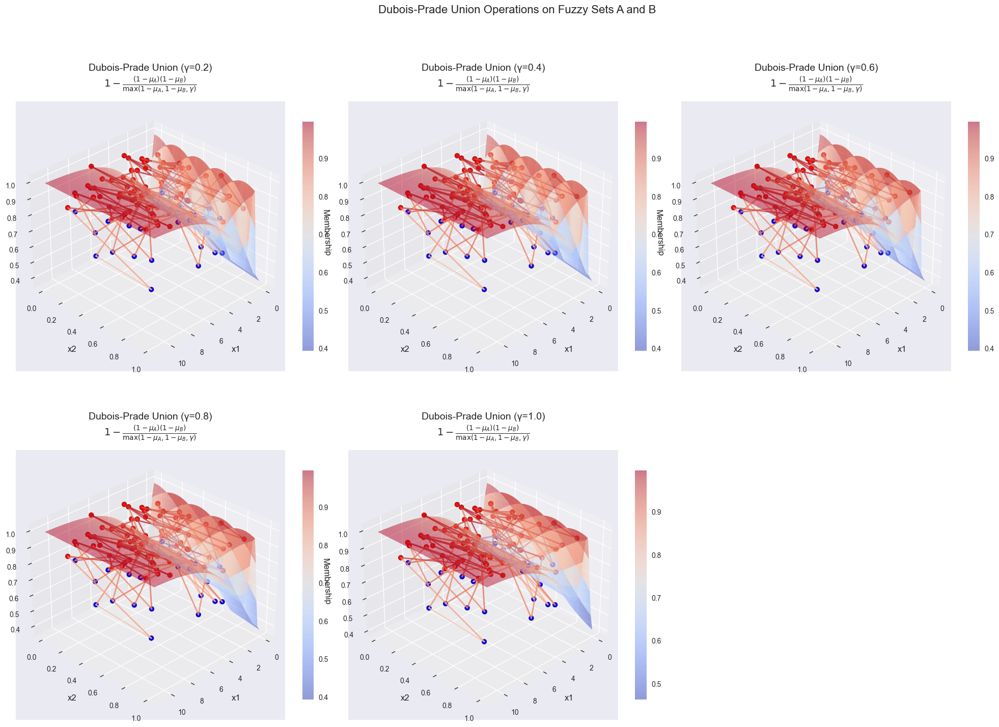

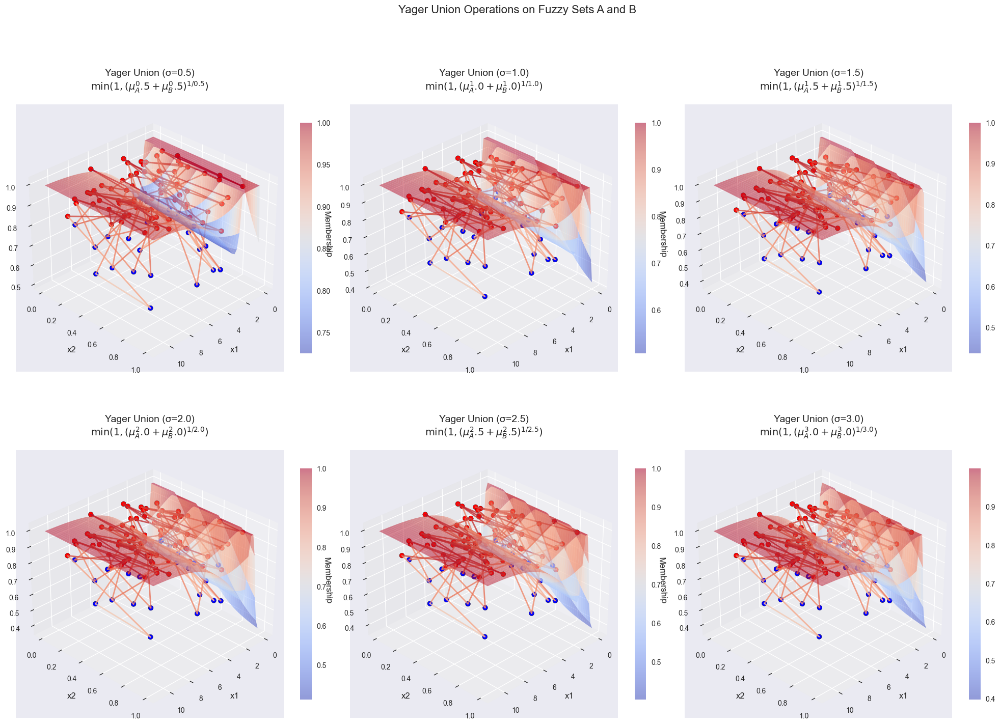

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from typing import List, Tuple
import random

def validate_input(data: List[Tuple[float, float]]) -> None:
    """Validate input data format and values."""
    if not data:
        raise ValueError("Input data cannot be empty")
    for point in data:
        if not isinstance(point, tuple) or len(point) != 2:
            raise ValueError("Each point must be a tuple of two numbers")
        if not all(isinstance(val, (int, float)) for val in point):
            raise ValueError("Point coordinates must be numbers")

def create_grid(x1: np.ndarray, x2: np.ndarray, padding: float = 1.0, points: int = 50) -> Tuple[np.ndarray, np.ndarray]:
    """Create mesh grid for surface plotting."""
    x1_grid = np.linspace(min(x1) - padding, max(x1) + padding, points)
    x2_grid = np.linspace(0, 1, points)
    return np.meshgrid(x1_grid, x2_grid)

def plot_function(ax: Axes3D, x1: np.ndarray, x2: np.ndarray, z: np.ndarray, 
                 X1: np.ndarray, X2: np.ndarray, Z: np.ndarray, 
                 title: str) -> Tuple:
    """Plot 3D surface and scatter points with custom coloring."""
    cmap = plt.colormaps['coolwarm']
    
    surf = ax.plot_surface(X1, X2, Z, cmap=cmap, alpha=0.5, rstride=1, cstride=1)
    
    point_colors = np.where(z > 0.8, 'red', 'blue')
    
    scatter = ax.scatter(x1, x2, z, c=point_colors, s=50, edgecolor='k', depthshade=False)
    
    sort_idx = np.argsort(x1)
    x1_sorted = x1[sort_idx]
    x2_sorted = x2[sort_idx]
    z_sorted = z[sort_idx]
    for i in range(len(x1_sorted)-1):
        ax.plot(x1_sorted[i:i+2], x2_sorted[i:i+2], z_sorted[i:i+2], 
                color=cmap((z_sorted[i]+z_sorted[i+1])/2), 
                linewidth=2, alpha=0.8)
    
    ax.set_xlabel('x1', fontsize=12, labelpad=10)
    ax.set_ylabel('x2', fontsize=12, labelpad=10)
    ax.set_zlabel('Membership', fontsize=12, labelpad=10)
    ax.set_title(title, fontsize=14, pad=20)
    
    ax.view_init(elev=30, azim=45)
    
    return surf, scatter

def generate_random_data(num_points: int = 100) -> List[Tuple[float, float]]:
    """Generate random data points for visualization."""
    return [(random.uniform(1, 10), random.random()) for _ in range(num_points)]

def calculate_membership(x1: np.ndarray, x2: np.ndarray, func_type: str) -> np.ndarray:
    """Calculate membership values based on function type."""
    if func_type == 'gaussian':
        return np.exp(-3 * (x1 - x2)**2)
    elif func_type == 'sigmoid':
        return 1 / (1 + np.exp(-0.5 * (x1 - x2)))
    else:
        raise ValueError("Unknown function type")

def dubois_prade_snorm(a: np.ndarray, b: np.ndarray, gamma: float) -> np.ndarray:
    """
    Dubois-Prade S-norm (Union operation):
    s_γ[a,b] = 1 - ( (1-a)(1-b) ) / max(1-a, 1-b, γ)
    γ ∈ [0,1]
    """
    one_minus_a = 1 - a
    one_minus_b = 1 - b
    denominator = np.maximum(np.maximum(one_minus_a, one_minus_b), gamma)
    return 1 - (one_minus_a * one_minus_b) / np.where(denominator == 0, 1e-10, denominator)

def yager_snorm(a: np.ndarray, b: np.ndarray, sigma: float) -> np.ndarray:
    """
    Yager S-norm (Union operation):
    s_σ[a,b] = min(1, (a^σ + b^σ)^(1/σ))
    σ ∈ (0,∞)
    """
    if sigma == 0:
        return np.maximum(a, b)
    return np.minimum(1, (a**sigma + b**sigma)**(1/sigma))

def visualize_operations(A: List[Tuple[float, float]], B: List[Tuple[float, float]]) -> None:
    """Visualize original sets and their union operations with connecting lines."""
    validate_input(A)
    validate_input(B)
    
    plt.style.use('seaborn-v0_8')
    
    x1_A = np.array([a[0] for a in A])
    x2_A = np.array([a[1] for a in A])
    x1_B = np.array([b[0] for b in B])
    x2_B = np.array([b[1] for b in B])
    
    z_A = calculate_membership(x1_A, x2_A, 'gaussian')
    z_B = calculate_membership(x1_B, x2_B, 'sigmoid')
    
    X1, X2 = create_grid(x1_A, x2_A)
    
    Z_A = calculate_membership(X1, X2, 'gaussian')
    Z_B = calculate_membership(X1, X2, 'sigmoid')
    
    dp_gammas = [0.2, 0.4, 0.6, 0.8, 1.0]
    yager_sigmas = [0.5, 1.0, 1.5, 2.0, 2.5, 3.0]
    
    fig1 = plt.figure(figsize=(20, 15))
    fig1.suptitle('Dubois-Prade Union Operations on Fuzzy Sets A and B', fontsize=16, y=1.02)
    
    for i, gamma in enumerate(dp_gammas, 1):
        ax = fig1.add_subplot(2, 3, i, projection='3d')
        Z_dp = dubois_prade_snorm(Z_A, Z_B, gamma)
        z_dp = dubois_prade_snorm(z_A, z_B, gamma)
        surf, _ = plot_function(
            ax, x1_A, x2_A, z_dp, X1, X2, Z_dp,
            f'Dubois-Prade Union (γ={gamma})\n$1-\\frac{{(1-μ_A)(1-μ_B)}}{{\\max(1-μ_A,1-μ_B,γ)}}$'
        )
        fig1.colorbar(surf, ax=ax, shrink=0.6)
    
    plt.tight_layout()
    
    # Yager visualization
    fig2 = plt.figure(figsize=(20, 15))
    fig2.suptitle('Yager Union Operations on Fuzzy Sets A and B', fontsize=16, y=1.02)
    
    for i, sigma in enumerate(yager_sigmas, 1):
        ax = fig2.add_subplot(2, 3, i, projection='3d')
        Z_yager = yager_snorm(Z_A, Z_B, sigma)
        z_yager = yager_snorm(z_A, z_B, sigma)
        surf, _ = plot_function(
            ax, x1_A, x2_A, z_yager, X1, X2, Z_yager,
            f'Yager Union (σ={sigma})\n$\\min(1,(μ_A^{sigma}+μ_B^{sigma})^{{1/{sigma}}})$'
        )
        fig2.colorbar(surf, ax=ax, shrink=0.6)
    
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    # Generate random data
    random.seed(42)
    A = generate_random_data(100)
    B = generate_random_data(100)
    
    try:
        visualize_operations(A, B)
    except Exception as e:
        print(f"Error: {str(e)}")

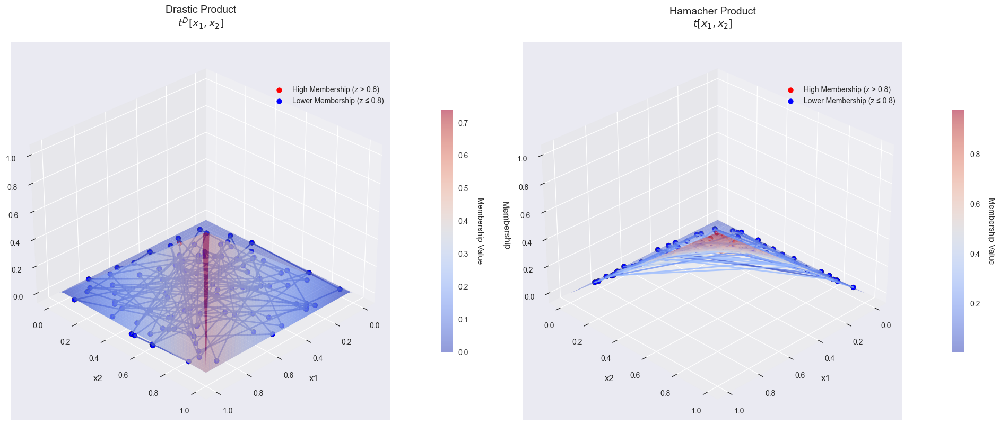

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from typing import List, Tuple
import random

# Drastic Product and Hamacher Product from your previous query
def drastic_product(x: float, y: float) -> float:
    if max(x, y) == 1:
        return min(x, y)
    elif x < 1 and y < 1:
        return 0
    return 0

def hamacher_product(x: float, y: float) -> float:
    if x == 0 and y == 0:
        return 0
    denominator = x + y - x * y
    if denominator == 0:
        return 0
    return (x * y) / denominator

# Rest of the provided code with modifications
def validate_input(data: List[Tuple[float, float]]) -> None:
    """Validate input data format and values."""
    if not data:
        raise ValueError("Input data cannot be empty")
    for point in data:
        if not isinstance(point, tuple) or len(point) != 2:
            raise ValueError("Each point must be a tuple of two numbers")
        if not all(isinstance(val, (int, float)) for val in point):
            raise ValueError("Point coordinates must be numbers")

def create_grid(x1: np.ndarray, x2: np.ndarray, padding: float = 1.0, points: int = 50) -> Tuple[np.ndarray, np.ndarray]:
    """Create mesh grid for surface plotting."""
    # Since x1 needs to be in [0,1], we'll normalize it in the main function
    x1_grid = np.linspace(0, 1, points)  # After normalization
    x2_grid = np.linspace(0, 1, points)
    return np.meshgrid(x1_grid, x2_grid)

def plot_function(ax: Axes3D, x1: np.ndarray, x2: np.ndarray, z: np.ndarray, 
                 X1: np.ndarray, X2: np.ndarray, Z: np.ndarray, 
                 title: str) -> Tuple:
    """Plot 3D surface and scatter points with custom coloring."""
    cmap = plt.colormaps['coolwarm'] 
    
    surf = ax.plot_surface(X1, X2, Z, cmap=cmap, alpha=0.5, rstride=1, cstride=1)
    
    point_colors = np.where(z > 0.8, 'red', 'blue')
    
    scatter = ax.scatter(x1, x2, z, c=point_colors, s=50, edgecolor='k', depthshade=False)
    
    for i in range(len(x1)-1):
        ax.plot(x1[i:i+2], x2[i:i+2], z[i:i+2], 
                color=cmap((z[i]+z[i+1])/2), 
                linewidth=2, alpha=0.8)
    
    ax.set_xlabel('x1', fontsize=12, labelpad=10)
    ax.set_ylabel('x2', fontsize=12, labelpad=10)
    ax.set_zlabel('Membership', fontsize=12, labelpad=10)
    ax.set_title(title, fontsize=14, pad=20)
    
    ax.view_init(elev=30, azim=45)
    
    return surf, scatter

def generate_random_data(num_points: int = 100) -> List[Tuple[float, float]]:
    """Generate random data points for visualization."""
    return [(random.uniform(1, 10), random.random()) for _ in range(num_points)]

def visualize_functions(A: List[Tuple[float, float]], B: List[Tuple[float, float]]) -> None:
    """Visualize Drastic Product and Hamacher Product in 3D space."""
    # Input validation
    validate_input(A)
    validate_input(B)
    
    plt.style.use('seaborn-v0_8')
    fig = plt.figure(figsize=(20, 10), dpi=100)
    
    # Normalize x1 to [0,1] for both A and B since Drastic and Hamacher expect inputs in [0,1]
    x1_A_raw = np.array([a[0] for a in A])
    x1_A = (x1_A_raw - min(x1_A_raw)) / (max(x1_A_raw) - min(x1_A_raw))  # Normalize to [0,1]
    x2_A = np.array([a[1] for a in A])
    
    # Calculate Drastic Product for data points
    z_A = np.array([drastic_product(x1_A[i], x2_A[i]) for i in range(len(x1_A))])
    
    # Create grid for surface
    X1_A, X2_A = create_grid(x1_A, x2_A)
    # Calculate Drastic Product for the grid
    Z_A = np.zeros_like(X1_A)
    for i in range(X1_A.shape[0]):
        for j in range(X1_A.shape[1]):
            Z_A[i, j] = drastic_product(X1_A[i, j], X2_A[i, j])
    
    ax1 = fig.add_subplot(121, projection='3d')
    surf_A, _ = plot_function(
        ax1, x1_A, x2_A, z_A, X1_A, X2_A, Z_A,
        'Drastic Product\n$t^D[x_1, x_2]$'
    )
    
    cbar1 = fig.colorbar(surf_A, ax=ax1, shrink=0.5, pad=0.1)
    cbar1.set_label('Membership Value', rotation=270, labelpad=20)
    
    # Normalize x1 for B
    x1_B_raw = np.array([b[0] for b in B])
    x1_B = (x1_B_raw - min(x1_B_raw)) / (max(x1_B_raw) - min(x1_B_raw))  # Normalize to [0,1]
    x2_B = np.array([b[1] for b in B])
    
    # Calculate Hamacher Product for data points
    z_B = np.array([hamacher_product(x1_B[i], x2_B[i]) for i in range(len(x1_B))])
    
    # Create grid for surface
    X1_B, X2_B = create_grid(x1_B, x2_B)
    # Calculate Hamacher Product for the grid
    Z_B = np.zeros_like(X1_B)
    for i in range(X1_B.shape[0]):
        for j in range(X1_B.shape[1]):
            Z_B[i, j] = hamacher_product(X1_B[i, j], X2_B[i, j])
    
    ax2 = fig.add_subplot(122, projection='3d')
    surf_B, _ = plot_function(
        ax2, x1_B, x2_B, z_B, X1_B, X2_B, Z_B,
        'Hamacher Product\n$t[x_1, x_2]$'
    )
    
    cbar2 = fig.colorbar(surf_B, ax=ax2, shrink=0.5, pad=0.1)
    cbar2.set_label('Membership Value', rotation=270, labelpad=20)
    
    for ax in [ax1, ax2]:
        ax.scatter([], [], c='red', label='High Membership (z > 0.8)', s=50)
        ax.scatter([], [], c='blue', label='Lower Membership (z ≤ 0.8)', s=50)
        ax.legend(loc='upper right', bbox_to_anchor=(1, 0.9), fontsize=10)
    
    plt.tight_layout(pad=3.0)
    plt.savefig('membership_function_visualization.png', dpi=300, bbox_inches='tight')
    plt.show()

if __name__ == "__main__":
    random.seed(42)
    A = generate_random_data(100)
    B = generate_random_data(100)
    
    try:
        visualize_functions(A, B)
    except Exception as e:
        print(f"Error: {str(e)}")

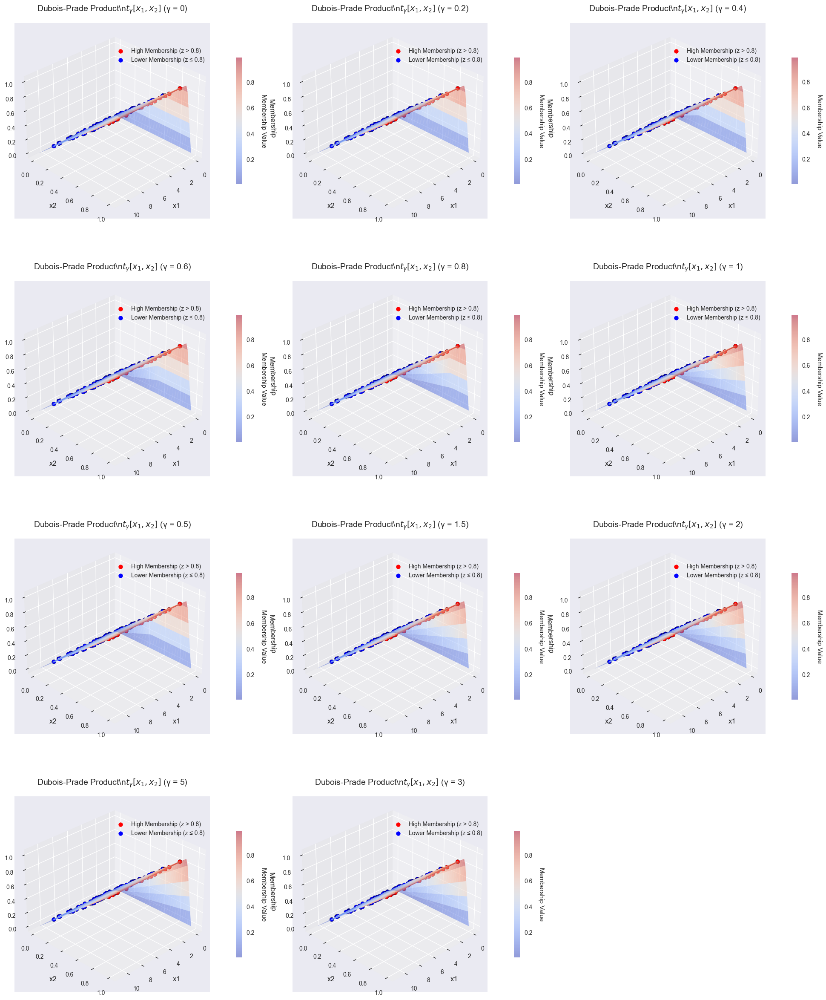

C:\Users\ndz13\AppData\Local\Temp\ipykernel_2312\3666258419.py:19: RuntimeWarning: invalid value encountered in scalar power
  term = ((1 - x)**sigma + (1 - y)**sigma)**(1/sigma)


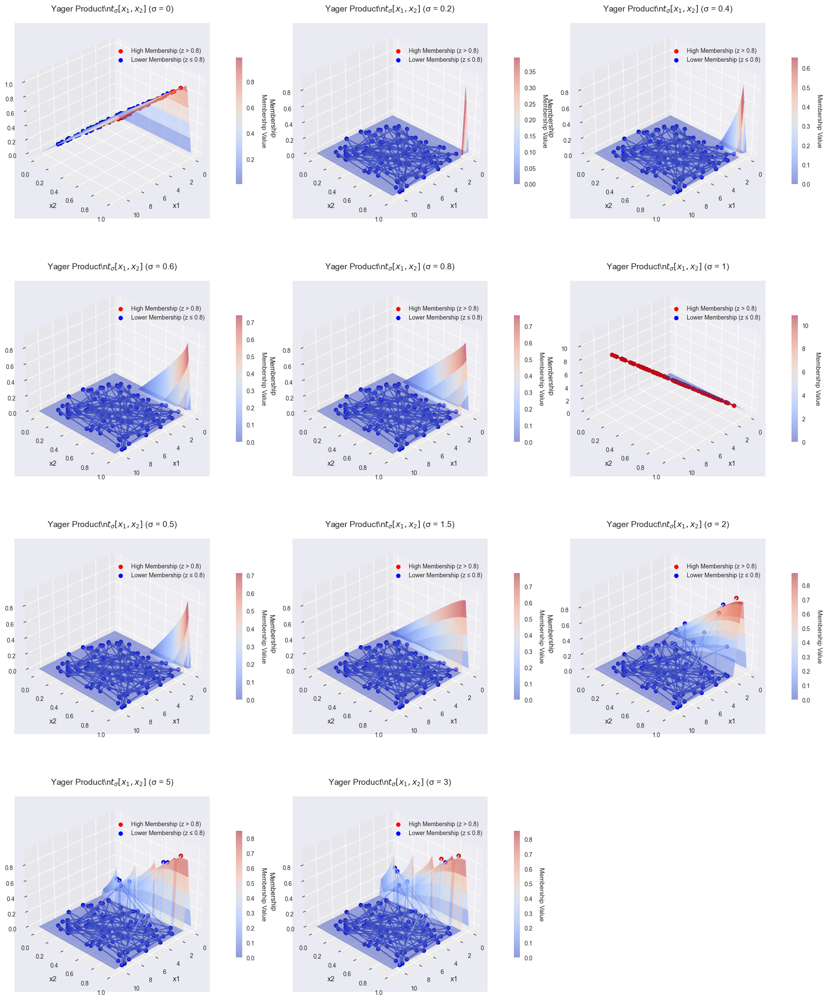

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from typing import List, Tuple
import random

# Dubois-Prade and Yager functions
def dubois_prade(x: float, y: float, gamma: float) -> float:
    gamma = np.clip(gamma, 0, 1)  # Clip gamma to [0, 1] for consistency
    denominator = max(x, y, gamma)
    if denominator == 0:
        return 0
    return (x * y) / denominator

def yager(x: float, y: float, sigma: float) -> float:
    sigma = np.clip(sigma, 0, 5)  # Clip sigma to [0, 5] for stability
    if sigma == 0:
        return min(x, y)  # Limit as sigma approaches 0
    term = ((1 - x)**sigma + (1 - y)**sigma)**(1/sigma)
    return 1 - min(1, term)

# Validation and grid functions
def validate_input(data: List[Tuple[float, float]]) -> None:
    """Validate input data format and values."""
    if not data:
        raise ValueError("Input data cannot be empty")
    for point in data:
        if not isinstance(point, tuple) or len(point) != 2:
            raise ValueError("Each point must be a tuple of two numbers")
        if not all(isinstance(val, (int, float)) for val in point):
            raise ValueError("Point coordinates must be numbers")

def create_grid(x1: np.ndarray, x2: np.ndarray, padding: float = 1.0, points: int = 50) -> Tuple[np.ndarray, np.ndarray]:
    """Create mesh grid for surface plotting."""
    x1_grid = np.linspace(min(x1) - padding, max(x1) + padding, points)
    x2_grid = np.linspace(0, 1, points)
    return np.meshgrid(x1_grid, x2_grid)

def plot_function(ax: Axes3D, x1: np.ndarray, x2: np.ndarray, z: np.ndarray, 
                 X1: np.ndarray, X2: np.ndarray, Z: np.ndarray, 
                 title: str) -> Tuple:
    """Plot 3D surface and scatter points with custom coloring."""
    cmap = plt.colormaps['coolwarm'] 
    surf = ax.plot_surface(X1, X2, Z, cmap=cmap, alpha=0.5, rstride=1, cstride=1)
    point_colors = np.where(z > 0.8, 'red', 'blue')
    scatter = ax.scatter(x1, x2, z, c=point_colors, s=50, edgecolor='k', depthshade=False)
    for i in range(len(x1)-1):
        ax.plot(x1[i:i+2], x2[i:i+2], z[i:i+2], 
                color=cmap((z[i]+z[i+1])/2), 
                linewidth=2, alpha=0.8)
    ax.set_xlabel('x1', fontsize=12, labelpad=10)
    ax.set_ylabel('x2', fontsize=12, labelpad=10)
    ax.set_zlabel('Membership', fontsize=12, labelpad=10)
    ax.set_title(title, fontsize=14, pad=20)
    ax.view_init(elev=30, azim=45)
    return surf, scatter

def generate_random_data(num_points: int = 100) -> List[Tuple[float, float]]:
    """Generate random data points for visualization."""
    return [(random.uniform(1, 10), random.random()) for _ in range(num_points)]

def visualize_dubois_prade(A: List[Tuple[float, float]]) -> None:
    """Visualize Dubois-Prade function for all gamma values."""
    validate_input(A)
    
    plt.style.use('seaborn-v0_8')
    fig = plt.figure(figsize=(20, 25), dpi=100)
    
    x1_A = np.array([a[0] for a in A])
    x2_A = np.array([a[1] for a in A])
    values = [0, 0.2, 0.4, 0.6, 0.8, 1, 0.5, 1.5, 2, 5, 3]
    
    for idx, gamma in enumerate(values):
        ax = fig.add_subplot(4, 3, idx + 1, projection='3d')
        X1, X2 = create_grid(x1_A, x2_A)
        Z = np.zeros_like(X1)
        for i in range(X1.shape[0]):
            for j in range(X1.shape[1]):
                Z[i, j] = dubois_prade(X1[i, j], X2[i, j], gamma)
        z_A = np.array([dubois_prade(x1_A[i], x2_A[i], gamma) for i in range(len(x1_A))])
        surf_A, _ = plot_function(
            ax, x1_A, x2_A, z_A, X1, X2, Z,
            r'Dubois-Prade Product\n$t_\gamma[x_1, x_2]$ (γ = {})'.format(gamma)
        )
        cbar = fig.colorbar(surf_A, ax=ax, shrink=0.5, pad=0.1)
        cbar.set_label('Membership Value', rotation=270, labelpad=20)
        ax.scatter([], [], c='red', label='High Membership (z > 0.8)', s=50)
        ax.scatter([], [], c='blue', label='Lower Membership (z ≤ 0.8)', s=50)
        ax.legend(loc='upper right', bbox_to_anchor=(1, 0.9), fontsize=10)
    
    plt.tight_layout(pad=3.0)
    plt.savefig('dubois_prade_all_gamma.png', dpi=300, bbox_inches='tight')
    plt.show()

def visualize_yager(B: List[Tuple[float, float]]) -> None:
    """Visualize Yager function for all sigma values."""
    validate_input(B)
    
    plt.style.use('seaborn-v0_8')
    fig = plt.figure(figsize=(20, 25), dpi=100)
    
    x1_B = np.array([b[0] for b in B])
    x2_B = np.array([b[1] for b in B])
    values = [0, 0.2, 0.4, 0.6, 0.8, 1, 0.5, 1.5, 2, 5, 3]
    
    for idx, sigma in enumerate(values):
        ax = fig.add_subplot(4, 3, idx + 1, projection='3d')
        X1, X2 = create_grid(x1_B, x2_B)
        Z = np.zeros_like(X1)
        for i in range(X1.shape[0]):
            for j in range(X1.shape[1]):
                Z[i, j] = yager(X1[i, j], X2[i, j], sigma)
        z_B = np.array([yager(x1_B[i], x2_B[i], sigma) for i in range(len(x1_B))])
        surf_B, _ = plot_function(
            ax, x1_B, x2_B, z_B, X1, X2, Z,
            r'Yager Product\n$t_\sigma[x_1, x_2]$ (σ = {})'.format(sigma)
        )
        cbar = fig.colorbar(surf_B, ax=ax, shrink=0.5, pad=0.1)
        cbar.set_label('Membership Value', rotation=270, labelpad=20)
        ax.scatter([], [], c='red', label='High Membership (z > 0.8)', s=50)
        ax.scatter([], [], c='blue', label='Lower Membership (z ≤ 0.8)', s=50)
        ax.legend(loc='upper right', bbox_to_anchor=(1, 0.9), fontsize=10)
    
    plt.tight_layout(pad=3.0)
    plt.savefig('yager_all_sigma.png', dpi=300, bbox_inches='tight')
    plt.show()

if __name__ == "__main__":
    random.seed(42)  
    A = generate_random_data(100)
    B = generate_random_data(100)
    
    try:
        visualize_dubois_prade(A)
        visualize_yager(B)
    except Exception as e:
        print(f"Error: {str(e)}")

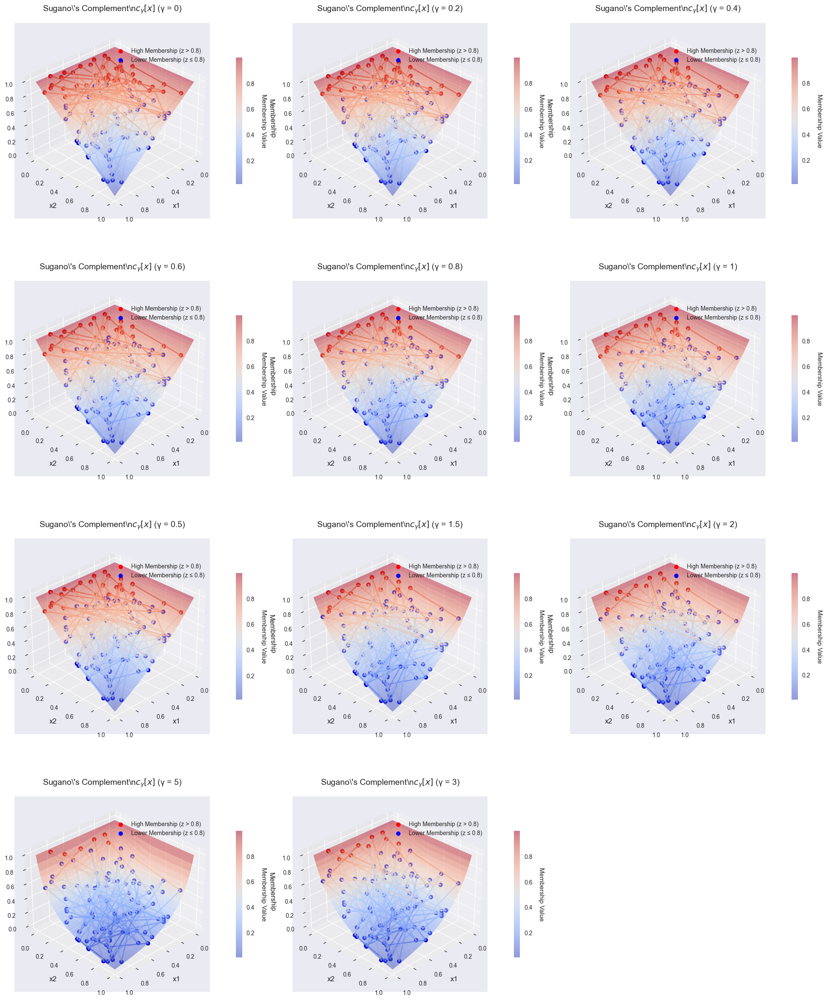

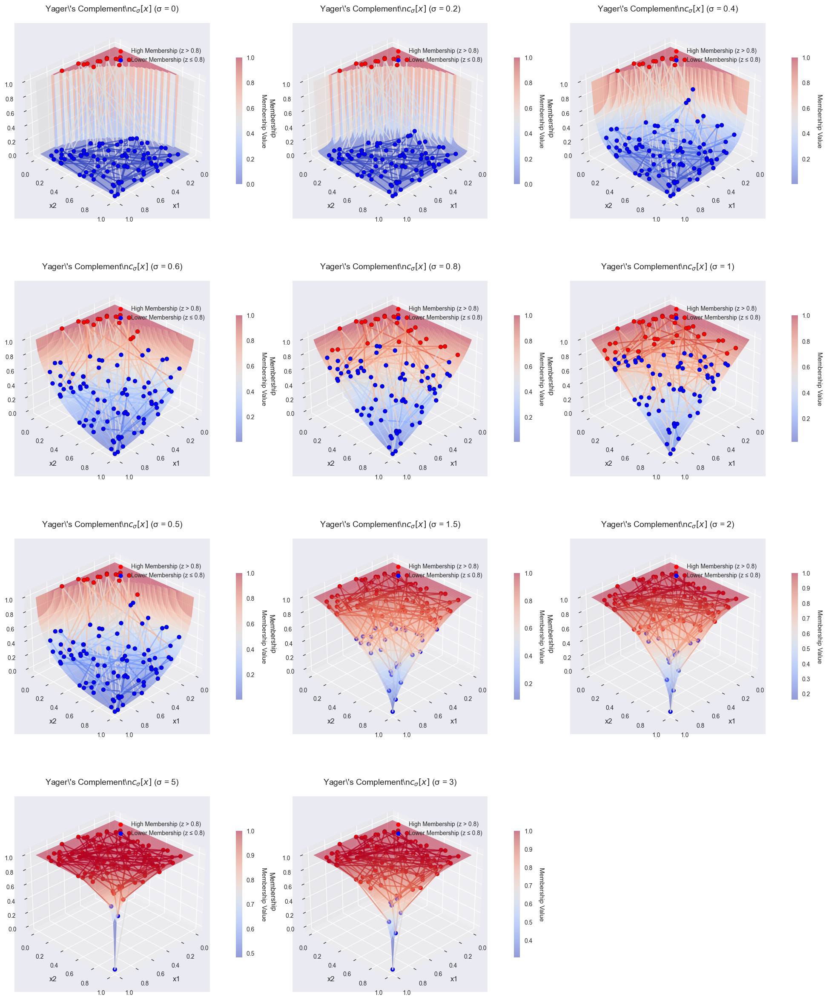

In [12]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from typing import List, Tuple
import random

# Dubois-Prade and Yager t-norm functions
def dubois_prade(x: float, y: float, gamma: float) -> float:
    gamma = np.clip(gamma, 0, 1)  # Clip gamma to [0, 1] for consistency
    denominator = max(x, y, gamma)
    if denominator == 0:
        return 0
    return (x * y) / denominator

def yager(x: float, y: float, sigma: float) -> float:
    sigma = np.clip(sigma, 0, 5)  # Clip sigma to [0, 5] for stability
    if sigma == 0:
        return min(x, y)  # Limit as sigma approaches 0
    term = ((1 - x)**sigma + (1 - y)**sigma)**(1/sigma)
    return 1 - min(1, term)

# Complement functions
def sugano_complement(x: float, gamma: float) -> float:
    gamma = np.clip(gamma, -0.99, np.inf)  # Clip gamma to (-1, inf), avoiding -1
    if 1 + gamma * x == 0:
        return 0  # Avoid division by zero
    return (1 - x) / (1 + gamma * x)

def yager_complement(x: float, sigma: float) -> float:
    sigma = np.clip(sigma, 0.01, np.inf)  # Clip sigma to (0, inf), avoiding 0
    if sigma == 0:
        return 1 - x  # Special case for sigma = 0
    return (1 - x**sigma)**(1/sigma)

# Validation and grid functions
def validate_input(data: List[Tuple[float, float]]) -> None:
    """Validate input data format and values."""
    if not data:
        raise ValueError("Input data cannot be empty")
    for point in data:
        if not isinstance(point, tuple) or len(point) != 2:
            raise ValueError("Each point must be a tuple of two numbers")
        if not all(isinstance(val, (int, float)) for val in point):
            raise ValueError("Point coordinates must be numbers")

def create_grid(x1: np.ndarray, x2: np.ndarray, padding: float = 1.0, points: int = 50) -> Tuple[np.ndarray, np.ndarray]:
    """Create mesh grid for surface plotting."""
    x1_grid = np.linspace(0, 1, points)  # Normalized to [0, 1]
    x2_grid = np.linspace(0, 1, points)
    return np.meshgrid(x1_grid, x2_grid)

def plot_function(ax: Axes3D, x1: np.ndarray, x2: np.ndarray, z: np.ndarray, 
                 X1: np.ndarray, X2: np.ndarray, Z: np.ndarray, 
                 title: str) -> Tuple:
    """Plot 3D surface and scatter points with custom coloring."""
    cmap = plt.colormaps['coolwarm'] 
    surf = ax.plot_surface(X1, X2, Z, cmap=cmap, alpha=0.5, rstride=1, cstride=1)
    point_colors = np.where(z > 0.8, 'red', 'blue')
    scatter = ax.scatter(x1, x2, z, c=point_colors, s=50, edgecolor='k', depthshade=False)
    for i in range(len(x1)-1):
        ax.plot(x1[i:i+2], x2[i:i+2], z[i:i+2], 
                color=cmap((z[i]+z[i+1])/2), 
                linewidth=2, alpha=0.8)
    ax.set_xlabel('x1', fontsize=12, labelpad=10)
    ax.set_ylabel('x2', fontsize=12, labelpad=10)
    ax.set_zlabel('Membership', fontsize=12, labelpad=10)
    ax.set_title(title, fontsize=14, pad=20)
    ax.view_init(elev=30, azim=45)
    return surf, scatter

def generate_random_data(num_points: int = 100) -> List[Tuple[float, float]]:
    """Generate random data points for visualization."""
    return [(random.uniform(1, 10), random.random()) for _ in range(num_points)]

def visualize_sugano_complement(A: List[Tuple[float, float]]) -> None:
    """Visualize Sugano's complement for all gamma values."""
    validate_input(A)
    
    plt.style.use('seaborn-v0_8')
    fig = plt.figure(figsize=(20, 25), dpi=100)
    
    x1_A = np.array([a[0] for a in A])
    x2_A = np.array([a[1] for a in A])
    # Normalize x1_A to [0, 1]; x2_A is already in [0, 1]
    x1_A = x1_A / np.max(x1_A)
    x2_A = x2_A / np.max(x2_A)  # Ensure x2_A is also normalized for consistency
    values = [0, 0.2, 0.4, 0.6, 0.8, 1, 0.5, 1.5, 2, 5, 3]
    
    # Compute base t-norm values (using Dubois-Prade as the membership function)
    z_base = np.array([dubois_prade(x1_A[i], x2_A[i], 0.5) for i in range(len(x1_A))])  # Using gamma=0.5 as a reference
    
    for idx, gamma in enumerate(values):
        ax = fig.add_subplot(4, 3, idx + 1, projection='3d')
        X1, X2 = create_grid(x1_A, x2_A)
        Z = np.zeros_like(X1)
        for i in range(X1.shape[0]):
            for j in range(X1.shape[1]):
                t_norm_value = dubois_prade(X1[i, j], X2[i, j], 0.5)  # Base t-norm
                Z[i, j] = sugano_complement(t_norm_value, gamma)
        z_A = np.array([sugano_complement(z_base[i], gamma) for i in range(len(z_base))])
        surf_A, _ = plot_function(
            ax, x1_A, x2_A, z_A, X1, X2, Z,
            r'Sugano\'s Complement\n$c_\gamma[x]$ (γ = {})'.format(gamma)
        )
        cbar = fig.colorbar(surf_A, ax=ax, shrink=0.5, pad=0.1)
        cbar.set_label('Membership Value', rotation=270, labelpad=20)
        ax.scatter([], [], c='red', label='High Membership (z > 0.8)', s=50)
        ax.scatter([], [], c='blue', label='Lower Membership (z ≤ 0.8)', s=50)
        ax.legend(loc='upper right', bbox_to_anchor=(1, 0.9), fontsize=10)
    
    plt.tight_layout(pad=3.0)
    plt.savefig('sugano_complement_all_gamma.png', dpi=300, bbox_inches='tight')
    plt.show()

def visualize_yager_complement(B: List[Tuple[float, float]]) -> None:
    """Visualize Yager's complement for all sigma values."""
    validate_input(B)
    
    plt.style.use('seaborn-v0_8')
    fig = plt.figure(figsize=(20, 25), dpi=100)
    
    x1_B = np.array([b[0] for b in B])
    x2_B = np.array([b[1] for b in B])
    # Normalize x1_B to [0, 1]; x2_B is already in [0, 1]
    x1_B = x1_B / np.max(x1_B)
    x2_B = x2_B / np.max(x2_B)  # Ensure x2_B is also normalized for consistency
    values = [0, 0.2, 0.4, 0.6, 0.8, 1, 0.5, 1.5, 2, 5, 3]
    
    # Compute base t-norm values (using Yager as the membership function)
    z_base = np.array([yager(x1_B[i], x2_B[i], 2.0) for i in range(len(x1_B))])  # Using sigma=2.0 as a reference
    
    for idx, sigma in enumerate(values):
        ax = fig.add_subplot(4, 3, idx + 1, projection='3d')
        X1, X2 = create_grid(x1_B, x2_B)
        Z = np.zeros_like(X1)
        for i in range(X1.shape[0]):
            for j in range(X1.shape[1]):
                t_norm_value = yager(X1[i, j], X2[i, j], 2.0)  # Base t-norm
                Z[i, j] = yager_complement(t_norm_value, sigma)
        z_B = np.array([yager_complement(z_base[i], sigma) for i in range(len(z_base))])
        surf_B, _ = plot_function(
            ax, x1_B, x2_B, z_B, X1, X2, Z,
            r'Yager\'s Complement\n$c_\sigma[x]$ (σ = {})'.format(sigma)
        )
        cbar = fig.colorbar(surf_B, ax=ax, shrink=0.5, pad=0.1)
        cbar.set_label('Membership Value', rotation=270, labelpad=20)
        ax.scatter([], [], c='red', label='High Membership (z > 0.8)', s=50)
        ax.scatter([], [], c='blue', label='Lower Membership (z ≤ 0.8)', s=50)
        ax.legend(loc='upper right', bbox_to_anchor=(1, 0.9), fontsize=10)
    
    plt.tight_layout(pad=3.0)
    plt.savefig('yager_complement_all_sigma.png', dpi=300, bbox_inches='tight')
    plt.show()

if __name__ == "__main__":
    random.seed(42)  
    A = generate_random_data(100)
    B = generate_random_data(100)
    
    try:
        visualize_sugano_complement(A)
        visualize_yager_complement(B)
    except Exception as e:
        print(f"Error: {str(e)}")